In [116]:
import netCDF4
import itertools

from tqdm import tqdm

import sys

Nx = 512
Ny = 512

def tau_1(arr_orig, tau, z, counter):
    
    ndp = len(arr_orig[0, 0, :])
    
    z_tau_1 = np.zeros((Nx, Ny))
    
    for i, j in tqdm(itertools.product(range(Nx), range(Ny)), desc = str(counter)):
        
        idx_tau_1 = np.argmin(abs(tau[:, j, i] - 1.0))
        
        z_tau_1[i, j] = z[idx_tau_1, j, i]
        
#    print(z_tau_1)
    
    if counter == 1: np.savez('z_tau_1', z = z_tau_1)
    if counter == 3: np.savez('z_tau_2', z = z_tau_1)
    
#    sys.exit()
    
    mean_z_tau_1 = np.mean(z_tau_1)
    
#    print(mean_z_tau_1)
        
    z_orig = np.flip(np.arange(0, ndp) * 10.0)
    
#    z_orig = np.arange(len(arr_orig[0, 0, :]) - 1, -1, -1) * 10.0
    
#    print(z_orig)
    
    idx_z_orig = np.argmin(abs(z_orig - mean_z_tau_1))
    
#    print(idx_z_orig)
    
#    sys.exit()
        
    return arr_orig[:, :, idx_z_orig]

T_ssd_orig_1d = np.fromfile('./ssd/eosT.222809.bin', dtype = np.float32)
p_ssd_orig_1d = np.fromfile('./ssd/eosP.222809.bin', dtype = np.float32)

T_300_orig_1d = np.fromfile('./300G/eosT.627321.bin', dtype = np.float32)
p_300_orig_1d = np.fromfile('./300G/eosP.627321.bin', dtype = np.float32)

T_ssd_orig = T_ssd_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))
p_ssd_orig = p_ssd_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))

T_300_orig = T_300_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))
p_300_orig = p_300_orig_1d.reshape(Nx, Ny, int(len(T_ssd_orig_1d) / Nx / Ny))

T_ssd = np.zeros((Nx, Ny))
p_ssd = np.zeros((Nx, Ny))

T_300 = np.zeros((Nx, Ny))
p_300 = np.zeros((Nx, Ny))

z = np.array(netCDF4.Dataset('./ssd/222809/10/Z_onTau.222809.nc.1')['Z']) / 1e+5
t = np.array(netCDF4.Dataset('./ssd/222809/10/taugrid.222809.nc.1')['tau'])

T_ssd = tau_1(T_ssd_orig, t, z, 1)
p_ssd = tau_1(p_ssd_orig, t, z, 2)

z = np.array(netCDF4.Dataset('./300G/627321/10/Z_onTau.627321.nc.1')['Z']) / 1e+5
t = np.array(netCDF4.Dataset('./300G/627321/10/taugrid.627321.nc.1')['tau'])

T_300 = tau_1(T_300_orig, t, z, 3)
p_300 = tau_1(p_300_orig, t, z, 4)

np.savez('ssd_mean_z',  T = T_ssd, p = p_ssd)
np.savez('300G_mean_z', T = T_300, p = p_300)

1: 262144it [00:05, 43757.44it/s]
2: 262144it [00:05, 44278.87it/s]
3: 262144it [00:06, 42439.97it/s]
4: 262144it [00:05, 45482.12it/s]


In [110]:
z1 = np.load('z_tau_1.npz')['z']
z2 = np.load('z_tau_2.npz')['z']

In [16]:
a = np.array([[1, 2],[3, 4]])

print(np.mean(a))

2.5


In [51]:
a = np.array([1,2,3,4])

In [55]:
np.flip(a)

array([4, 3, 2, 1])

In [56]:
a

array([1, 2, 3, 4])

In [113]:
z_orig = np.flip(np.arange(0, len(T_300_orig[0, 0, :])) * 10.0)

In [111]:
np.mean(z1)

1168.8161197411828

In [100]:
z_orig = np.arange(len(T_300_orig[0, 0, :]) - 1, -1, -1) * 10.0

In [101]:
z_orig

array([1790., 1780., 1770., 1760., 1750., 1740., 1730., 1720., 1710.,
       1700., 1690., 1680., 1670., 1660., 1650., 1640., 1630., 1620.,
       1610., 1600., 1590., 1580., 1570., 1560., 1550., 1540., 1530.,
       1520., 1510., 1500., 1490., 1480., 1470., 1460., 1450., 1440.,
       1430., 1420., 1410., 1400., 1390., 1380., 1370., 1360., 1350.,
       1340., 1330., 1320., 1310., 1300., 1290., 1280., 1270., 1260.,
       1250., 1240., 1230., 1220., 1210., 1200., 1190., 1180., 1170.,
       1160., 1150., 1140., 1130., 1120., 1110., 1100., 1090., 1080.,
       1070., 1060., 1050., 1040., 1030., 1020., 1010., 1000.,  990.,
        980.,  970.,  960.,  950.,  940.,  930.,  920.,  910.,  900.,
        890.,  880.,  870.,  860.,  850.,  840.,  830.,  820.,  810.,
        800.,  790.,  780.,  770.,  760.,  750.,  740.,  730.,  720.,
        710.,  700.,  690.,  680.,  670.,  660.,  650.,  640.,  630.,
        620.,  610.,  600.,  590.,  580.,  570.,  560.,  550.,  540.,
        530.,  520.,

In [114]:
idx_z_orig = np.argmin(abs(z_orig - np.mean(z1)))

In [115]:
idx_z_orig

62

In [104]:
z_orig[idx_z_orig]

1170.0

In [36]:
int(len(T_ssd_orig_1d) / Nx / Ny)

180

In [4]:
import netCDF4

z = np.array(netCDF4.Dataset('./ssd/222809/10/Z_onTau.222809.nc.1')['Z']) / 1e+5

In [17]:
t = np.array(netCDF4.Dataset('./ssd/222809/10/taugrid.222809.nc.1')['tau'])

In [18]:
t[]

array([[[3.1622777e-10, 3.1622777e-10, 3.1622777e-10, ...,
         3.1622777e-10, 3.1622777e-10, 3.1622777e-10],
        [3.1622777e-10, 3.1622777e-10, 3.1622777e-10, ...,
         3.1622777e-10, 3.1622777e-10, 3.1622777e-10],
        [3.1622777e-10, 3.1622777e-10, 3.1622777e-10, ...,
         3.1622777e-10, 3.1622777e-10, 3.1622777e-10],
        ...,
        [3.1622777e-10, 3.1622777e-10, 3.1622777e-10, ...,
         3.1622777e-10, 3.1622777e-10, 3.1622777e-10],
        [3.1622777e-10, 3.1622777e-10, 3.1622777e-10, ...,
         3.1622777e-10, 3.1622777e-10, 3.1622777e-10],
        [3.1622777e-10, 3.1622777e-10, 3.1622777e-10, ...,
         3.1622777e-10, 3.1622777e-10, 3.1622777e-10]],

       [[4.1686937e-10, 4.1686937e-10, 4.1686937e-10, ...,
         4.1686937e-10, 4.1686937e-10, 4.1686937e-10],
        [4.1686937e-10, 4.1686937e-10, 4.1686937e-10, ...,
         4.1686937e-10, 4.1686937e-10, 4.1686937e-10],
        [4.1686937e-10, 4.1686937e-10, 4.1686937e-10, ...,
         4.168

In [9]:
z[:, 53, 342]

array([  14.665745,   18.79748 ,   23.906466,   30.152897,   37.65294 ,
         46.49274 ,   56.719475,   68.320595,   81.20917 ,   95.25955 ,
        110.3085  ,  126.15264 ,  142.59634 ,  159.47623 ,  176.61812 ,
        193.85536 ,  211.07275 ,  228.18439 ,  245.06989 ,  261.6787  ,
        277.9876  ,  294.01733 ,  306.50702 ,  315.25015 ,  323.5007  ,
        332.1787  ,  341.52023 ,  351.38544 ,  361.6332  ,  372.5189  ,
        383.8082  ,  395.21716 ,  407.03094 ,  419.42624 ,  432.4744  ,
        446.18973 ,  460.6805  ,  476.24612 ,  493.02344 ,  510.2744  ,
        527.46533 ,  544.9684  ,  562.5532  ,  580.2296  ,  597.18365 ,
        613.1326  ,  628.46704 ,  643.25446 ,  656.5317  ,  669.36865 ,
        683.36475 ,  697.86584 ,  711.0961  ,  723.88104 ,  736.58685 ,
        749.63525 ,  763.22046 ,  777.30286 ,  791.9238  ,  807.1164  ,
        822.813   ,  838.9573  ,  855.41266 ,  872.09705 ,  889.1065  ,
        906.6137  ,  924.7188  ,  943.43146 ,  962.7064  ,  982.

In [31]:
z = np.array(netCDF4.Dataset('./ssd/222809/10/Z_onTau.222809.nc.1')['Z']) / 1e+5

t = np.array(netCDF4.Dataset('./ssd/222809/10/taugrid.222809.nc.1')['tau'])

In [32]:
np.argmin(abs(t[:, 54, 34] - 1.0))

79

In [35]:
print(t[78, 54, 34])
print(t[79, 54, 34])
print(t[80, 54, 34])
print(t[81, 54, 34])
print('----')
print(z[79, 54, 34])
print(z[80, 54, 34])
print(z[81, 54, 34])

0.724436
0.9549926
1.2589254
1.6595869
----
1126.4844
1138.0857
1147.5665


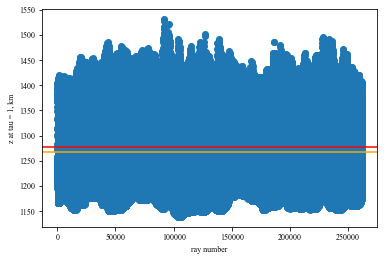

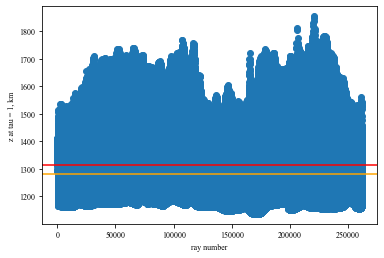

In [64]:
import matplotlib.pyplot as plt

plt.scatter(np.arange(len(z1.flatten())), z1.flatten())

plt.axhline(y = np.mean(z1.flatten()),   color = 'r')
plt.axhline(y = np.median(z1.flatten()), color = 'orange')

plt.xlabel('ray number')
plt.ylabel('z at tau = 1, km')

plt.show()

plt.scatter(np.arange(len(z2.flatten())), z2.flatten())

plt.axhline(y = np.mean(z2.flatten()),   color = 'r')
plt.axhline(y = np.median(z2.flatten()), color = 'orange')

plt.xlabel('ray number')
plt.ylabel('z at tau = 1, km')

plt.show()

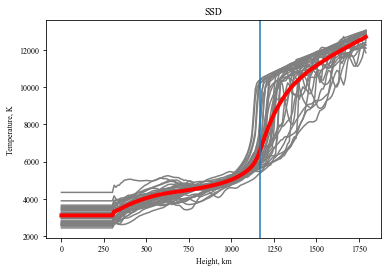

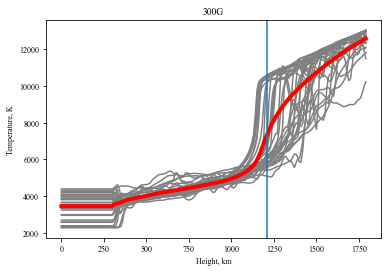

In [108]:
sample = np.random.choice(Nx * Ny, 32, replace = False)

Nz = 180

z = np.flip(np.arange(0, 180) * 10)

T_ssd = T_ssd_orig.reshape(Nx * Ny, Nz)

for k in sample:
    
    plt.plot(z, T_ssd[k, :], color = 'gray')

T_ssd_mean = np.mean(T_ssd, axis = 0)

plt.plot(z, T_ssd_mean, color = 'r', linewidth = 4)

plt.axvline(x = np.mean(z1.flatten()))

plt.title('SSD')

plt.xlabel('Height, km')
plt.ylabel('Temperature, K')

plt.show()

T_300 = T_300_orig.reshape(Nx * Ny, Nz)

for k in sample:
    
    plt.plot(z, T_300[k, :], color = 'gray')

T_300_mean = np.mean(T_300, axis = 0)

plt.plot(z, T_300_mean, color = 'r', linewidth = 4)

plt.axvline(x = np.mean(z2.flatten()))

plt.title('300G')

plt.xlabel('Height, km')
plt.ylabel('Temperature, K')

plt.show()

In [14]:
z = np.arange(0, 180) * 10

In [16]:
len(T_300_orig[0, 0, :])

180

In [128]:
T_ssd = np.load('ssd_mean_z.npz')['T']
p_ssd = np.load('ssd_mean_z.npz')['p']

T_300 = np.load('300G_mean_z.npz')['T']
p_300 = np.load('300G_mean_z.npz')['p']

lp = 10
up = 90

tmin = min(np.percentile(T_ssd, lp), np.percentile(T_300, lp))
pmin = min(np.percentile(p_ssd, lp), np.percentile(p_300, lp))

tmax = max(np.percentile(T_ssd, up), np.percentile(T_300, up))
pmax = max(np.percentile(p_ssd, up), np.percentile(p_300, up))

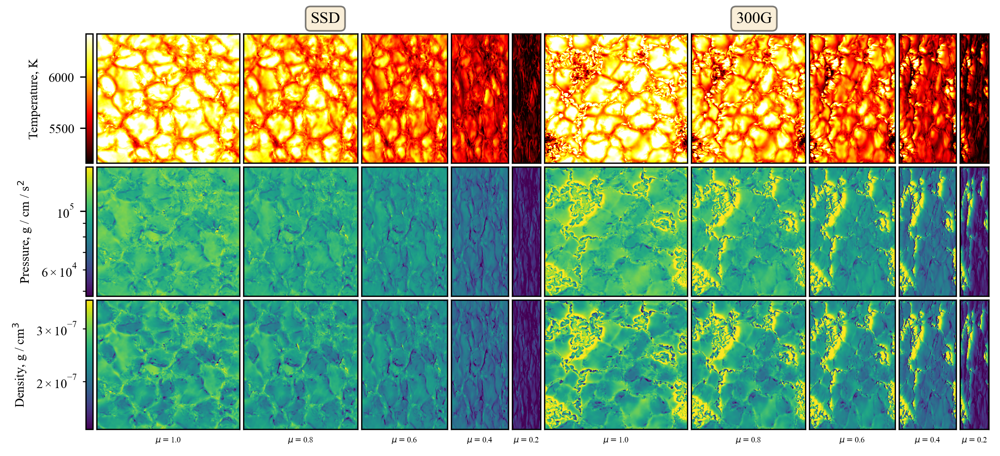

In [21]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'
colormap3 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(10, 4.5, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(3, 11, width_ratios = [0.05, 1, 0.8, 0.6, 0.4, 0.2, 1, 0.8, 0.6, 0.4, 0.2], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])
dens_cbar = plt.subplot(gs[2, 0])

for i in range(1, 6):

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, i])
    ssd_pres = plt.subplot(gs[1, i])
        
    ssd_dens = plt.subplot(gs[2, i])
        
    if i == 2: ssd_temp.text(300, 600, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_pres.set_xlim(0, 511)
    ssd_pres.set_ylim(0, 511)
        
    ssd_dens.set_xlim(0, 511)
    ssd_dens.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_pres.xaxis.set_ticklabels([])
    ssd_pres.yaxis.set_ticklabels([])
        
    ssd_dens.xaxis.set_ticklabels([])
    ssd_dens.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])
    
    ssd_pres.xaxis.set_ticks([])
    ssd_pres.yaxis.set_ticks([])
        
    ssd_dens.xaxis.set_ticks([])
    ssd_dens.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 5 + i])
    mag_pres = plt.subplot(gs[1, 5 + i])
        
    mag_dens = plt.subplot(gs[2, 5 + i])
        
    if i == 2: mag_temp.text(200, 600, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_pres.set_xlim(0, 511)
    mag_pres.set_ylim(0, 511)
        
    mag_dens.set_xlim(0, 511)
    mag_dens.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])
        
    mag_pres.xaxis.set_ticklabels([])
    mag_pres.yaxis.set_ticklabels([])
        
    mag_dens.xaxis.set_ticklabels([])
    mag_dens.yaxis.set_ticklabels([])
        
    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])
    
    mag_pres.xaxis.set_ticks([])
    mag_pres.yaxis.set_ticks([])
        
    mag_dens.xaxis.set_ticks([])
    mag_dens.yaxis.set_ticks([])
        
#----------------------------------------------
        
    pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    dnorm = colors.LogNorm(vmin = dmin, vmax = dmax)
        
#    if j == 7: mpnorm = MidPointLogNorm(vmin = rmin, vmax = rmax, midpoint = 1)
#    if j != 7: mpnorm = colors.TwoSlopeNorm(vmin = rmin, vmax = rmax, vcenter = 1)
    
    ssd_temp_img = ssd_temp.imshow(T_ssd[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    ssd_pres_img = ssd_pres.imshow(p_ssd[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    ssd_dens_img = ssd_dens.imshow(d_ssd[i - 1, :, :], cmap = colormap3, norm = dnorm, aspect = 'auto')
        
    mag_temp_img = mag_temp.imshow(T_300[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    mag_pres_img = mag_pres.imshow(p_300[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    mag_dens_img = mag_dens.imshow(d_300[i - 1, :, :], cmap = colormap3, norm = dnorm, aspect = 'auto')
    
    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
    pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
    dens_cb = Colorbar(ax = dens_cbar, mappable = ssd_dens_img, orientation = 'vertical', ticklocation = 'left')
        
    ssd_dens.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
    mag_dens.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)
dens_cb.set_label(r'Density, g / cm$^3$', labelpad = 5)

plt.savefig('intro_full.pdf', bbox_inches = 'tight')

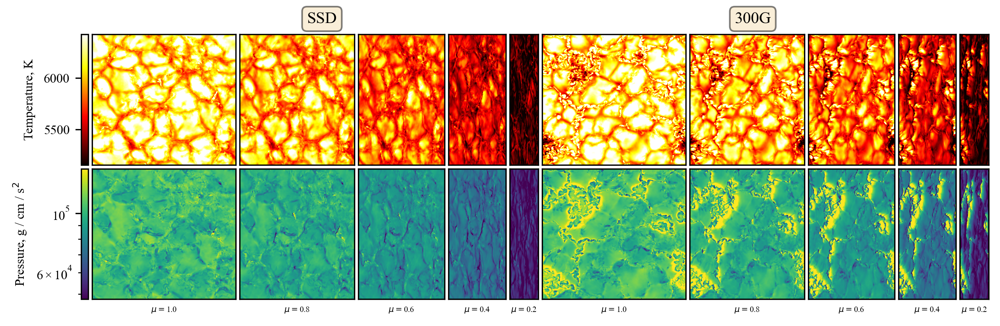

In [25]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(10, 3.0, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(2, 11, width_ratios = [0.05, 1, 0.8, 0.6, 0.4, 0.2, 1, 0.8, 0.6, 0.4, 0.2], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])

for i in range(1, 6):

#------------------------------------------
# settings for SSD

    ssd_temp = plt.subplot(gs[0, i])
    ssd_pres = plt.subplot(gs[1, i])
        
    if i == 2: ssd_temp.text(300, 600, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

    ssd_temp.set_xlim(0, 511)
    ssd_temp.set_ylim(0, 511)

    ssd_pres.set_xlim(0, 511)
    ssd_pres.set_ylim(0, 511)

    ssd_temp.xaxis.set_ticklabels([])
    ssd_temp.yaxis.set_ticklabels([])
        
    ssd_pres.xaxis.set_ticklabels([])
    ssd_pres.yaxis.set_ticklabels([])
        
    ssd_temp.xaxis.set_ticks([])
    ssd_temp.yaxis.set_ticks([])
    
    ssd_pres.xaxis.set_ticks([])
    ssd_pres.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

    mag_temp = plt.subplot(gs[0, 5 + i])
    mag_pres = plt.subplot(gs[1, 5 + i])
        
    if i == 2: mag_temp.text(200, 600, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

    mag_temp.set_xlim(0, 511)
    mag_temp.set_ylim(0, 511)

    mag_pres.set_xlim(0, 511)
    mag_pres.set_ylim(0, 511)

    mag_temp.xaxis.set_ticklabels([])
    mag_temp.yaxis.set_ticklabels([])
        
    mag_pres.xaxis.set_ticklabels([])
    mag_pres.yaxis.set_ticklabels([])
        
    mag_temp.xaxis.set_ticks([])
    mag_temp.yaxis.set_ticks([])
    
    mag_pres.xaxis.set_ticks([])
    mag_pres.yaxis.set_ticks([])
        
#----------------------------------------------
        
    pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
    ssd_temp_img = ssd_temp.imshow(T_ssd[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    ssd_pres_img = ssd_pres.imshow(p_ssd[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
        
    mag_temp_img = mag_temp.imshow(T_300[i - 1, :, :], cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
    mag_pres_img = mag_pres.imshow(p_300[i - 1, :, :], cmap = colormap2, norm = pnorm, aspect = 'auto')
    
    temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
    pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
        
    ssd_pres.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
    mag_pres.set_xlabel(r'$\mu = $' + mus[i - 1], fontsize = 5)
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)

plt.savefig('intro_img_1.pdf', bbox_inches = 'tight')

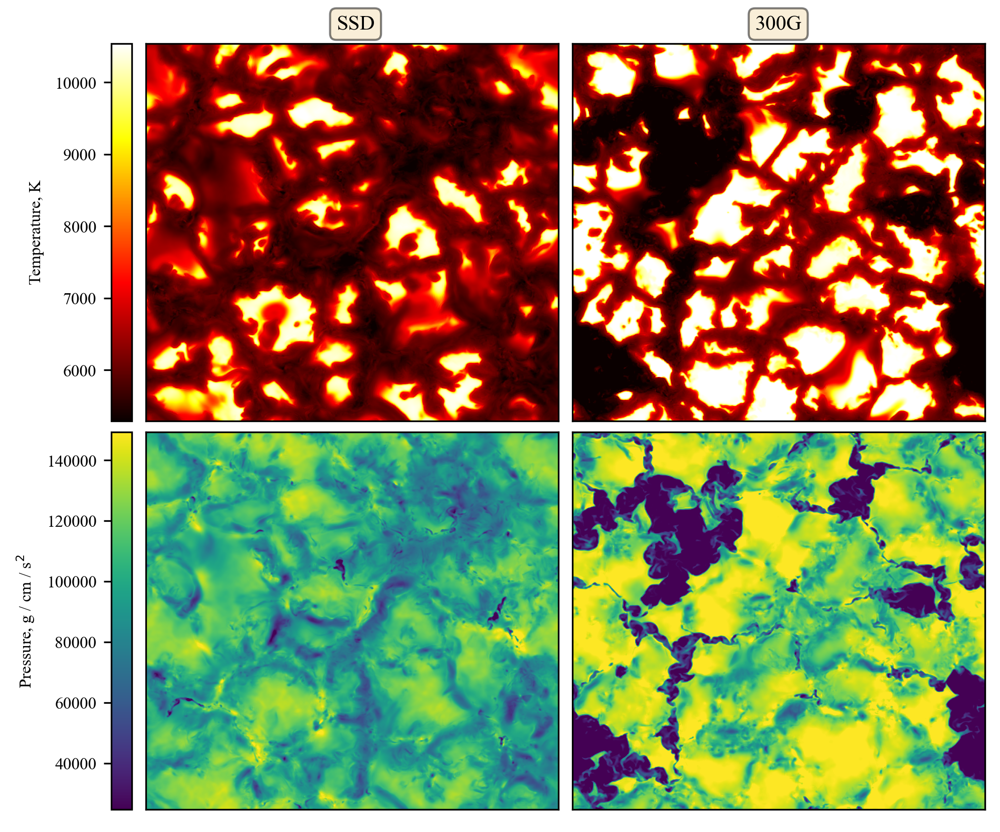

In [129]:
import matplotlib.pyplot as plt

import matplotlib.gridspec as gridspec
from matplotlib.colorbar import Colorbar

from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import MultipleLocator

import matplotlib.colors as colors

from  matplotlib.colors import LogNorm

props = dict(boxstyle = 'round', facecolor = 'wheat', alpha = 0.5)

plt.rcParams.update({'font.size': 8})
plt.rcParams["font.family"] = 'Times New Roman'

colormap1 = 'hot'
colormap2 = 'viridis'

mus = ['1.0', '0.8', '0.6', '0.4', '0.2']
    
plt.close('all')

fig = plt.figure(dpi = 300)

fig.set_size_inches(7.5, 11.25 * 3 / 5, forward = True)

fig.tight_layout()

gs = gridspec.GridSpec(2, 3, width_ratios = [0.05, 1, 1], hspace = 0.03, wspace = 0.05)

temp_cbar = plt.subplot(gs[0, 0])
pres_cbar = plt.subplot(gs[1, 0])

#------------------------------------------
# settings for SSD

ssd_temp = plt.subplot(gs[0, 1])
ssd_pres = plt.subplot(gs[1, 1])
        
ssd_temp.text(236, 550, 'SSD', fontsize = 10, verticalalignment = 'top', bbox = props)

ssd_temp.set_xlim(0, 511)
ssd_temp.set_ylim(0, 511)

ssd_pres.set_xlim(0, 511)
ssd_pres.set_ylim(0, 511)

ssd_temp.xaxis.set_ticklabels([])
ssd_temp.yaxis.set_ticklabels([])
        
ssd_pres.xaxis.set_ticklabels([])
ssd_pres.yaxis.set_ticklabels([])
        
ssd_temp.xaxis.set_ticks([])
ssd_temp.yaxis.set_ticks([])
    
ssd_pres.xaxis.set_ticks([])
ssd_pres.yaxis.set_ticks([])

#------------------------------------------
# settings for 300G

mag_temp = plt.subplot(gs[0, 2])
mag_pres = plt.subplot(gs[1, 2])
        
mag_temp.text(226, 550, '300G', fontsize = 10, verticalalignment = 'top', bbox = props)

mag_temp.set_xlim(0, 511)
mag_temp.set_ylim(0, 511)

mag_pres.set_xlim(0, 511)
mag_pres.set_ylim(0, 511)

mag_temp.xaxis.set_ticklabels([])
mag_temp.yaxis.set_ticklabels([])
        
mag_pres.xaxis.set_ticklabels([])
mag_pres.yaxis.set_ticklabels([])
        
mag_temp.xaxis.set_ticks([])
mag_temp.yaxis.set_ticks([])
    
mag_pres.xaxis.set_ticks([])
mag_pres.yaxis.set_ticks([])
        
#----------------------------------------------
        
#pnorm = colors.LogNorm(vmin = pmin, vmax = pmax)
    
ssd_temp_img = ssd_temp.imshow(T_ssd, cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
#ssd_pres_img = ssd_pres.imshow(p_ssd, cmap = colormap2, norm = pnorm, aspect = 'auto')
ssd_pres_img = ssd_pres.imshow(p_ssd, cmap = colormap2, vmin = pmin, vmax = pmax, aspect = 'auto')
        
mag_temp_img = mag_temp.imshow(T_300, cmap = colormap1, vmin = tmin, vmax = tmax, aspect = 'auto')
#mag_pres_img = mag_pres.imshow(p_300, cmap = colormap2, norm = pnorm, aspect = 'auto')
mag_pres_img = mag_pres.imshow(p_300, cmap = colormap2, vmin = pmin, vmax = pmax, aspect = 'auto')
    
temp_cb = Colorbar(ax = temp_cbar, mappable = ssd_temp_img, orientation = 'vertical', ticklocation = 'left')
pres_cb = Colorbar(ax = pres_cbar, mappable = ssd_pres_img, orientation = 'vertical', ticklocation = 'left')
        
temp_cb.set_label('Temperature, K', labelpad = 5)
pres_cb.set_label('Pressure, g / cm / s$^2$', labelpad = 5)

plt.savefig('intro_img_1_mean_z_p10_90.pdf', bbox_inches = 'tight')

In [106]:
Nx = 512
Ny = 512
Nz = 601

z_ssd = np.array(netCDF4.Dataset('./ssd/222809/10/Z_onTau.222809.nc.1')['Z']).reshape(Nz, Nx * Ny) / 1e+5
T_ssd = np.array(netCDF4.Dataset('./ssd/222809/10/T_onTau.222809.nc.1')['T']).reshape(Nz, Nx * Ny)
t_ssd = np.array(netCDF4.Dataset('./ssd/222809/10/taugrid.222809.nc.1')['tau']).reshape(Nz, Nx * Ny)

z_300 = np.array(netCDF4.Dataset('./300G/627321/10/Z_onTau.627321.nc.1')['Z']).reshape(Nz, Nx * Ny) / 1e+5
T_300 = np.array(netCDF4.Dataset('./300G/627321/10/T_onTau.627321.nc.1')['T']).reshape(Nz, Nx * Ny)
t_300 = np.array(netCDF4.Dataset('./300G/627321/10/taugrid.627321.nc.1')['tau']).reshape(Nz, Nx * Ny)

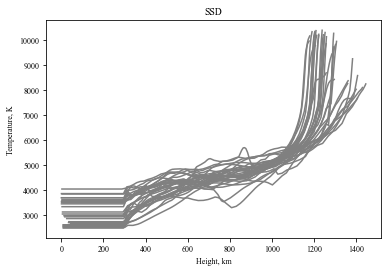

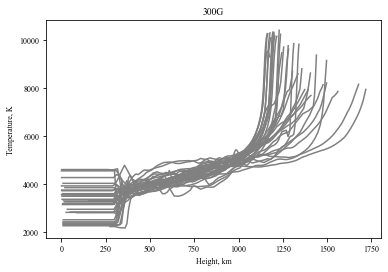

In [107]:
sample = np.random.choice(Nx * Ny, 32, replace = False)

for k in sample:
    
    plt.plot(z_ssd[:, k], T_ssd[:, k], color = 'gray')

#T_ssd_mean = np.mean(T_ssd, axis = 0)

#plt.plot(z, T_ssd_mean, color = 'r', linewidth = 4)

#plt.axvline(x = np.mean(z1.flatten()))

plt.title('SSD')

plt.xlabel('Height, km')
plt.ylabel('Temperature, K')

plt.show()

for k in sample:
    
    plt.plot(z_300[:, k], T_300[:, k], color = 'gray')

plt.title('300G')

plt.xlabel('Height, km')
plt.ylabel('Temperature, K')

plt.show()

In [72]:
np.flip(z_300[:, 10])

array([1212.2316   , 1212.2269   , 1212.2223   , 1212.2177   ,
       1212.213    , 1212.2084   , 1212.2036   , 1212.199    ,
       1212.1943   , 1212.1897   , 1212.185    , 1212.1804   ,
       1212.1758   , 1212.1711   , 1212.1665   , 1212.1619   ,
       1212.1572   , 1212.1526   , 1212.148    , 1212.1433   ,
       1212.1387   , 1212.134    , 1212.1294   , 1212.1248   ,
       1212.1201   , 1212.1155   , 1212.1108   , 1212.1062   ,
       1212.1016   , 1212.0969   , 1212.0923   , 1212.0876   ,
       1212.083    , 1212.0784   , 1212.0737   , 1212.0691   ,
       1212.0646   , 1212.0599   , 1212.0553   , 1212.0507   ,
       1212.046    , 1212.0414   , 1212.0367   , 1212.0321   ,
       1212.0275   , 1212.0228   , 1212.0183   , 1212.0137   ,
       1212.009    , 1212.0045   , 1211.9999   , 1211.9952   ,
       1211.9906   , 1211.986    , 1211.9813   , 1211.9767   ,
       1211.9722   , 1211.9675   , 1211.963    , 1211.9584   ,
       1211.9537   , 1211.9491   , 1211.9445   , 1211.9

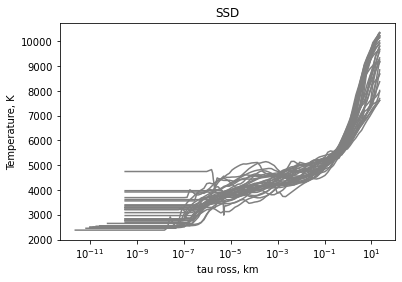

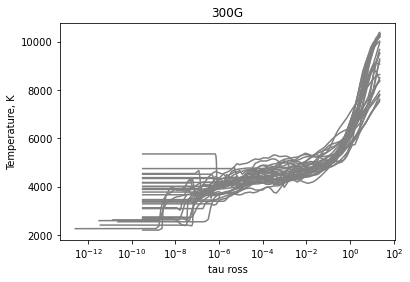

In [50]:
for k in sample:
    
    plt.plot(t_ssd[:, k], T_ssd[:, k], color = 'gray')

#T_ssd_mean = np.mean(T_ssd, axis = 0)

#plt.plot(z, T_ssd_mean, color = 'r', linewidth = 4)

#plt.axvline(x = np.mean(z1.flatten()))

plt.title('SSD')

plt.xlabel('tau ross, km')
plt.ylabel('Temperature, K')

plt.xscale('log')

plt.show()

for k in sample:
    
    plt.plot(t_300[:, k], T_300[:, k], color = 'gray')

plt.title('300G')

plt.xlabel('tau ross')
plt.ylabel('Temperature, K')

plt.xscale('log')

plt.show()